# Ross Sea synthetic gravity inversion

Here we try to recover the true bathymetry of the Ross Sea from a synthetic airborne gravity survey. See notebook `Ross_Sea_synthetic_model.ipynb` for the creation of this synthetic gravity data and the low-resolution starting model of bathymetry. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import plotting, optimization, synthetic, regional
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

import copy
from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import harmonica as hm
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import scipy as sp
import pvxarray
import geopandas as gpd
import rioxarray
import pygmt
import plotly.graph_objects as go
import optuna
from optuna.storages import JournalStorage, JournalFileStorage
import warnings
import os
import pathlib
import string
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pickle
import string
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm.contrib.itertools import product
from tqdm.autonotebook import tqdm

sns.set_theme()

# Load data

## topographic layers
* full resolution bed 
* low resolution bed

In [2]:
bed = xr.open_zarr("../../synthetic_data/Ross_Sea_bed.zarr").z

starting_bed = xr.open_zarr(
    "../../synthetic_data/Ross_Sea_lowres_bed_semiregular.zarr"
).z

# ensure all xarray are same data type
bed = bed.astype(np.float64)
starting_bed = starting_bed.astype(np.float64)

print(utils.get_grid_info(bed))
print(utils.get_grid_info(starting_bed))
starting_bed

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


(5000.0, [-80000.0, 300000.0, -1840000.0, -1360000.0], -968.675476074, -168.314071655, 'g')
(5000.0, [-80000.0, 300000.0, -1840000.0, -1360000.0], -969.619506836, -164.541534424, 'g')


<xarray.DataArray 'z' (northing: 97, easting: 77)>
dask.array<open_dataset-7b8eea31923f7d4997f7318b5e4fac15z, shape=(97, 77), dtype=float64, chunksize=(97, 77), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 -8e+04 -7.5e+04 -7e+04 ... 2.95e+05 3e+05
  * northing  (northing) float64 -1.84e+06 -1.835e+06 ... -1.365e+06 -1.36e+06
Attributes:
    metadata:  Generated by SplineCV(dampings=[1e-20, 3.162277660168379e-13, ...

## gravity data
* airborne survey gravity data
* full resolution forward gravity of the regional field (basement)

In [3]:
# true regional gravity anomaly
true_regional_grav = xr.open_zarr(
    "../../synthetic_data/Ross_Sea_forward_grav.zarr"
).basement

# airborne survey gravity point data
grav_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_survey_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement,bathymetry,forward_total,test,upward
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0
...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0


# Set region and parameters

Use the same regions and parameters as `Ross_Sea synthetic_model.ipynb`

In [4]:
layer_spacing, buffer_region, _, _, registration = utils.get_grid_info(bed)

# set gravity observation parameters
grav_spacing = layer_spacing

inversion_region = vd.pad_region(buffer_region, pad=-40e3)

# set density contrast
density = 2300 - 1024
# density = 2500 - 1024

print(f"layer spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

layer spacing: 5000.0m
registration: g
inversion region =  (-40000.0, 260000.0, -1800000.0, -1400000.0)
buffer region =  [-80000.0, 300000.0, -1840000.0, -1360000.0]


# Prep grav data
## grav data

In [5]:
grav_df = inv_utils.prep_grav_data(
    grav_df,
    region=inversion_region,
    input_grav_name="forward_total",
    input_coord_names=("easting", "northing", "upward"),
)
grav_survey_df = inv_utils.prep_grav_data(
    grav_survey_df,
    region=inversion_region,
    input_grav_name="pred",
    input_coord_names=("easting", "northing", "upward"),
)

print(f"Gravity data: {len(grav_df)} points")
print(f"Gravity data: {len(grav_survey_df)} points")
print(f"gravity avg. elevation: {int(np.nanmean(grav_df.upward))}")

Gravity data: 19481 points
Gravity data: 19481 points
gravity avg. elevation: 1000


## constraint points

In [6]:
# load constraint points into a dataframe
constraints_all = pd.read_csv(
    "../../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraints = utils.points_inside_region(
    constraints_all, inversion_region, names=("easting", "northing")
)

print(f"bathymetry control points:{len(constraints)}")
constraints.head()

bathymetry control points:1014


,northing,easting,inside,upward,uncert
624,-1800000.0,-40000.0,False,-459.983720,5.0
625,-1800000.0,-35000.0,False,-441.729016,5.0
626,-1800000.0,-30000.0,False,-423.061710,5.0
627,-1800000.0,-25000.0,False,-404.248569,5.0
628,-1800000.0,-20000.0,False,-401.593575,5.0


## Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the low-resolution bathymetry density contrast. This will be the input into our inversion.


## Bed prisms

In [7]:
# create prisms around low-res bathymetry
# positive densities above reference, negative below
print(f"Bathymetry density contrast: {density}kgm-3")

bed_prisms = inv_utils.grids_to_prisms(
    surface=starting_bed,
    reference=np.nanmean(starting_bed.values),
    density=xr.where(
        starting_bed >= np.nanmean(starting_bed.values), density, -density
    ),
)

# plotting.show_prism_layers(
#     [layer2_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

Bathymetry density contrast: 1276kgm-3


## Bed gravity

In [9]:
# calculate gravity of layer1
bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
    [bed_prisms],
    grav_df,
    names=["bed_prisms"],
    remove_median=False,
    progressbar=True,
    plot=False,
)
grav_df["bed_forward"] = bed_grav_df.forward_total

bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
    [bed_prisms],
    grav_survey_df,
    names=["bed_prisms"],
    remove_median=False,
    progressbar=True,
    plot=False,
)
grav_survey_df["bed_forward"] = bed_grav_df.forward_total

grav_df

  0%|                                                 | 0/19481 [00:00<?, ?it/s]

  0%|                                                 | 0/19481 [00:00<?, ?it/s]

,northing,easting,basement,bathymetry,Gobs,test,upward,bed_forward
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0,1.588803
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0,2.189981
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0,2.731633
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0,3.225948
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0,3.687668
...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0,-16.379783
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0,-16.835889
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0,-17.321311
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0,-17.722308


# Misfit

In [10]:
grav_df = inv.misfit(
    input_grav=grav_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    constraints=constraints,
)
grav_survey_df = inv.misfit(
    input_grav=grav_survey_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    constraints=constraints,
)

DC shifted observed gravity by 5.93mGal to match forward gravity.
DC shifted observed gravity by 5.8mGal to match forward gravity.


### Save and load results

In [11]:
grav_df.to_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)
grav_survey_df.to_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity_survey.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [12]:
grav_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_survey_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity_survey.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement,bathymetry,Gobs,test,upward,bed_forward,Gobs_shift,misfit
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0,1.588803,6.559877,4.971074
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0,2.189981,7.547098,5.357117
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0,2.731633,8.432908,5.701275
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0,3.225948,9.114063,5.888115
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0,3.687668,9.724166,6.036497
...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0,-16.379783,-26.890228,-10.510445
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0,-16.835889,-28.164188,-11.328299
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0,-17.321311,-29.511161,-12.189849
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0,-17.722308,-30.954328,-13.232020


# Regional - Residual seperation

Here we seperate the gravity misfit into `regional` and `residual` components. Since we created the synthetic model, we precisely know the regional component (the forward gravity of the `basement` layer), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

Highest score: 0.9955180873872438
Best damping: 6.158482110660255e-10


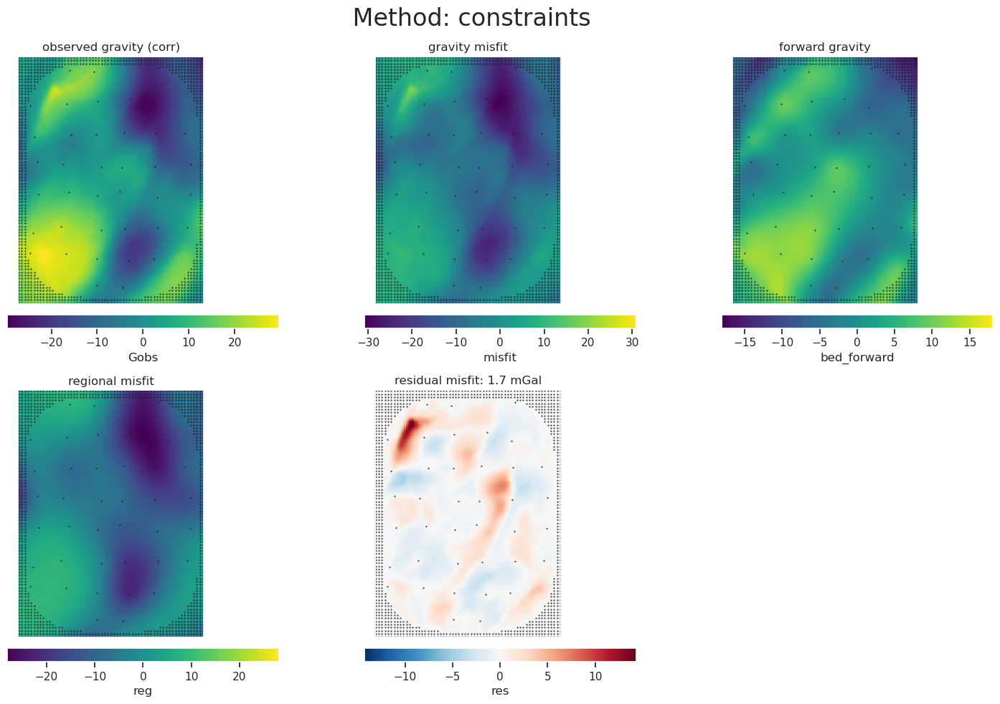

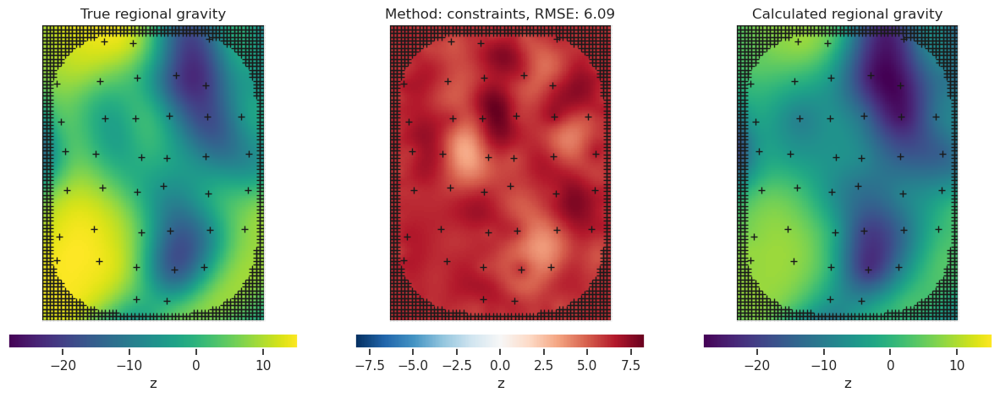

In [15]:
regional_kwargs = dict(
    input_grav=grav_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=20),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=inversion_region,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="vik",
    # diff_cmap="vik+h0",
    hist=True,
    inset=False,
    points_style="c.15c",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

Highest score: 0.9951570920925693
Best damping: 4.2813323987193956e-13


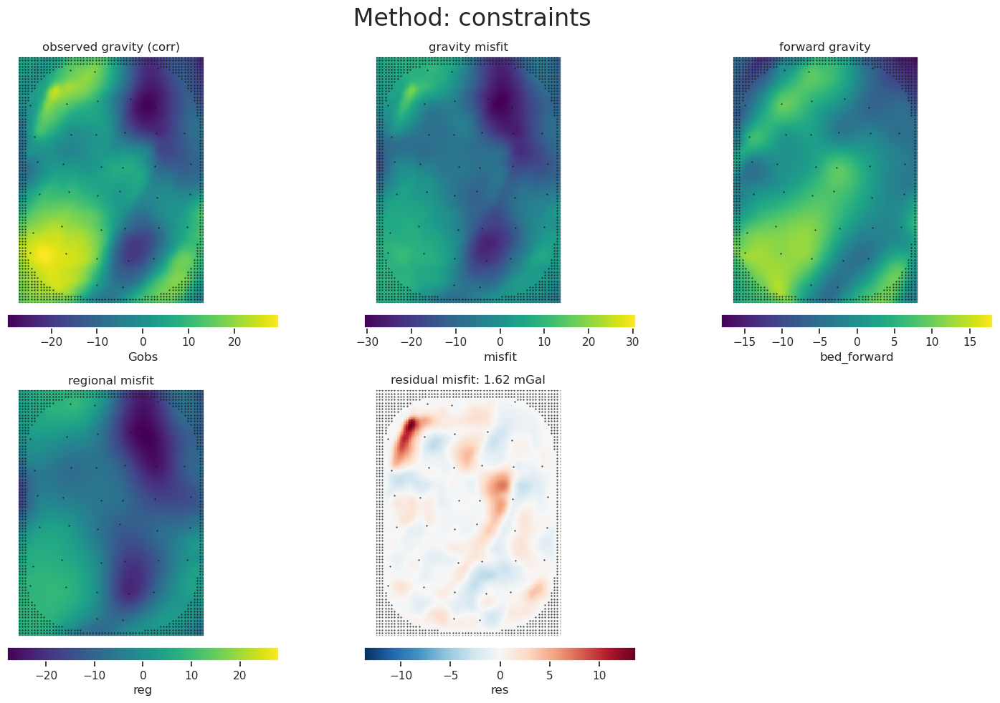

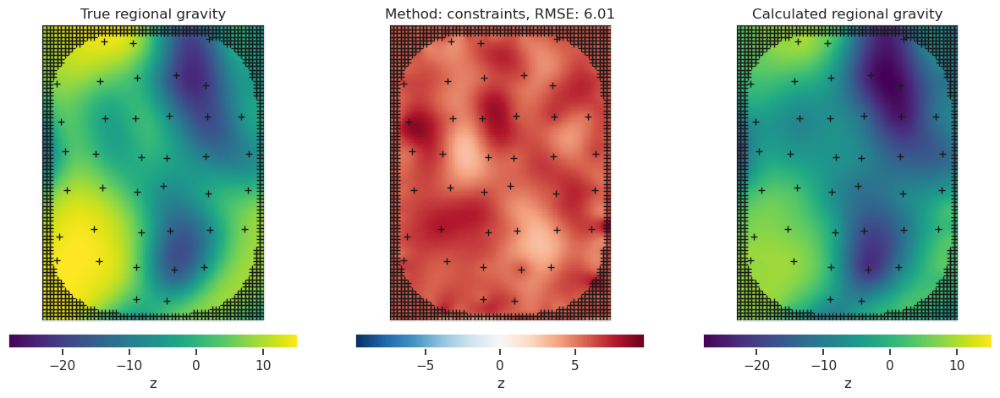

In [16]:
regional_kwargs = dict(
    input_grav=grav_survey_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=20),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_survey_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_survey_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=inversion_region,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="vik",
    # diff_cmap="vik+h0",
    hist=True,
    inset=False,
    points_style="c.15c",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

### Save and load results

In [17]:
df_anomalies.to_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)
df_survey_anomalies.to_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies_survey.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [18]:
df_anomalies = pd.read_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_survey_anomalies = pd.read_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies_survey.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_anomalies

,northing,easting,basement,bathymetry,Gobs,test,upward,bed_forward,Gobs_shift,misfit,reg,res
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0,1.588803,6.559877,4.971074,5.022509,-0.051435
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0,2.189981,7.547098,5.357117,5.352206,0.004911
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0,2.731633,8.432908,5.701275,5.650633,0.050642
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0,3.225948,9.114063,5.888115,5.861210,0.026905
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0,3.687668,9.724166,6.036497,6.028600,0.007897
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0,-16.379783,-26.890228,-10.510445,-10.445572,-0.064873
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0,-16.835889,-28.164188,-11.328299,-11.344710,0.016411
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0,-17.321311,-29.511161,-12.189849,-12.279732,0.089883
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0,-17.722308,-30.954328,-13.232020,-13.264367,0.032347


# Constraints grid

In [20]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist
# starting_prisms.weights.plot()

In [21]:
enc = {x: {"compressor": zarr.Blosc()} for x in starting_prisms}
starting_prisms.to_zarr(
    "../../inversion_layers/Ross_Sea_starting_prisms.zarr",
    encoding=enc,
    mode="w",
)

In [16]:
starting_prisms = xr.open_zarr(
    "../../inversion_layers/Ross_Sea_starting_prisms.zarr",
)

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true bathymetry. 

In [71]:
# starting_prisms = copy.deepcopy(bed_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     region=inversion_region,
# )
# starting_prisms["weights"] = min_dist#**.5

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15,
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping = 10**-2,
#     plot_convergence=True,
# )

# df = df_survey_anomalies

# # with inv_utils.HiddenPrints():
# inv_result = inv.inversion_RMSE(
#     input_grav=df[df.test==False],
#     inversion_region=inversion_region,
#     true_surface = bed,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = inv_result

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="bed_forward",
#     constraints = constraints[constraints.inside],
#     true_surface = bed,
#     start = [inversion_region[0], inversion_region[3]],
#     stop = [inversion_region[1], inversion_region[2]],
#     map_buffer = 0.02,
#     subplot_orientation='horizontal',
#     data_legend_loc = "jBR+o0c",
#     layers_legend_loc = "jBR+o0c",
#     layers_frame = ["nEsw","xafg", "ya+lElevation (m)"],
#     data_frame = ["nEsw","xafg", "ya+lGravity (mGal)"],
# )

# # print(f"RMSE: {rmse}")
# # print(f"constraints RMSE: {constraints_rmse}")
# # # get last iteration's layer result

# # ds = prism_results.set_index(["northing", "easting"]).to_xarray()
# # cols = [s for s in prism_results.columns.to_list() if "_layer" in s]
# # final_bed = ds[cols[-1]]

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.023216155581247757
Best damping: 0.01


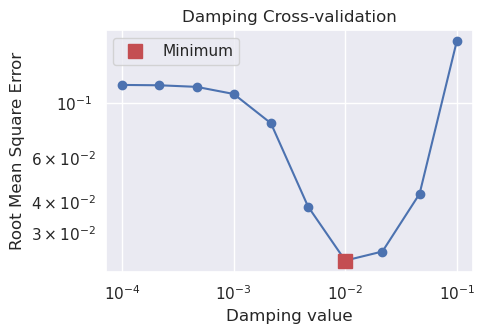

In [33]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../../synthetic_data/Ross_Sea_full_res_damping_CV_2500_dens"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

scores, rmses = inv.inversion_optimal_parameters(
    training_data=df_anomalies[df_anomalies.test == False],
    testing_data=df_anomalies[df_anomalies.test == True],
    parameter_values=dampings,
    function=inv.inversion_damping_MSE,
    plot=False,
    plot_grids=False,
    results_fname=fname,
    progressbar=True,
    true_surface=bed,
    inversion_region=inversion_region,
    **kwargs,
)

# put scores and damping values into dict
CV_results = dict(scores=scores, dampings=dampings, rmses=rmses)

# remove if exists
pathlib.Path(fname).unlink(missing_ok=True)

# save scores and dampings to pickle
with open(f"{fname}.pickle", "wb") as f:
    pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

# delete other results to save space
fnames = []
for i in range(len(dampings)):
    if i == best:
        pass
    else:
        fnames.append(f"{fname}_trial_{i}.pickle")
for f in fnames:
    pathlib.Path(f).unlink(missing_ok=True)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

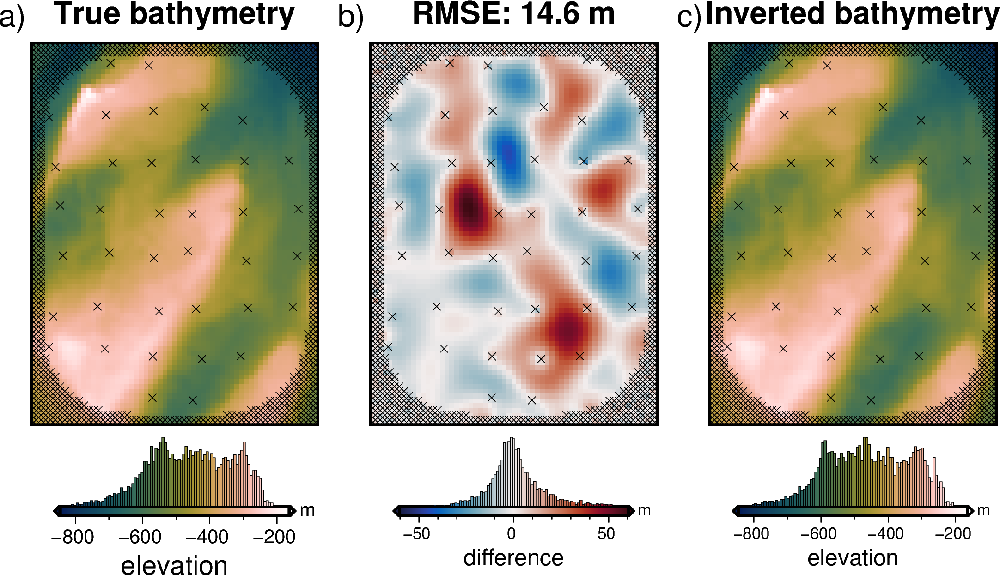

RMSE: 14.64349589201456
constraints RMSE: 0.45


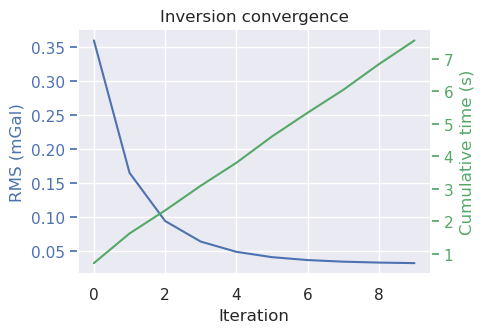

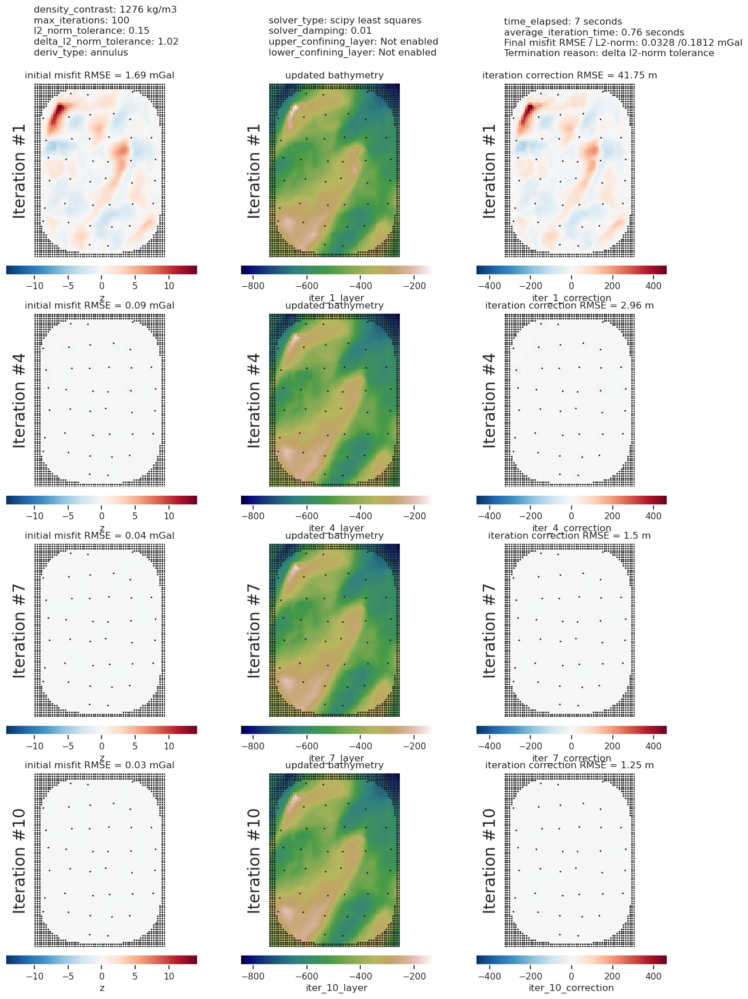

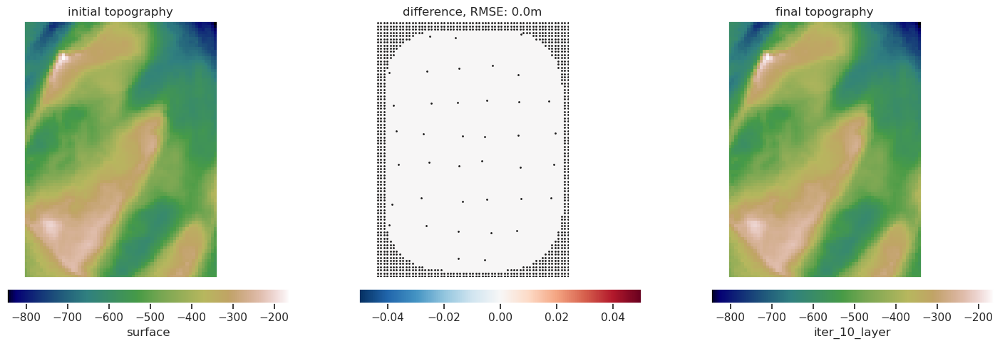

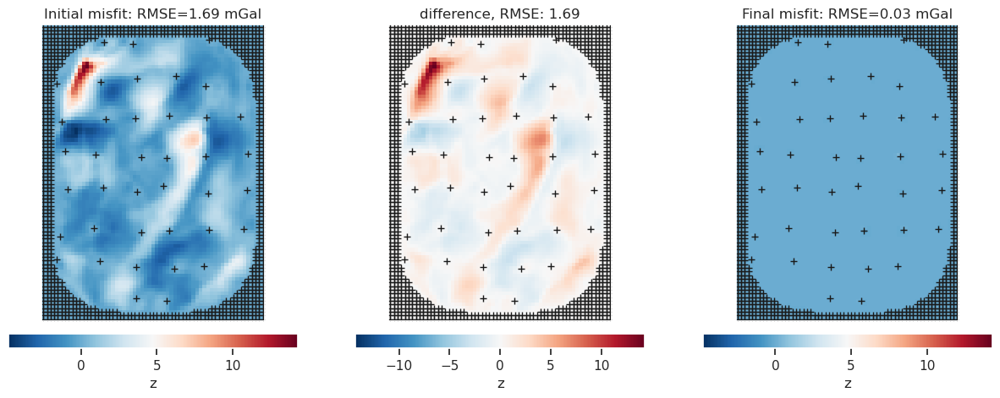

In [25]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies[df_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

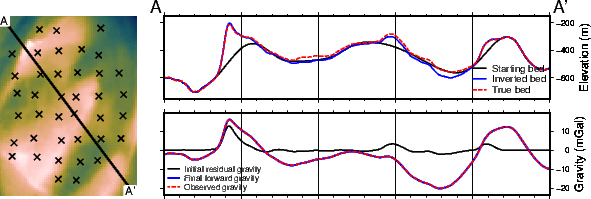

In [28]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="bed_forward",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.02,
    subplot_orientation="horizontal",
    data_legend_loc="jBL+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

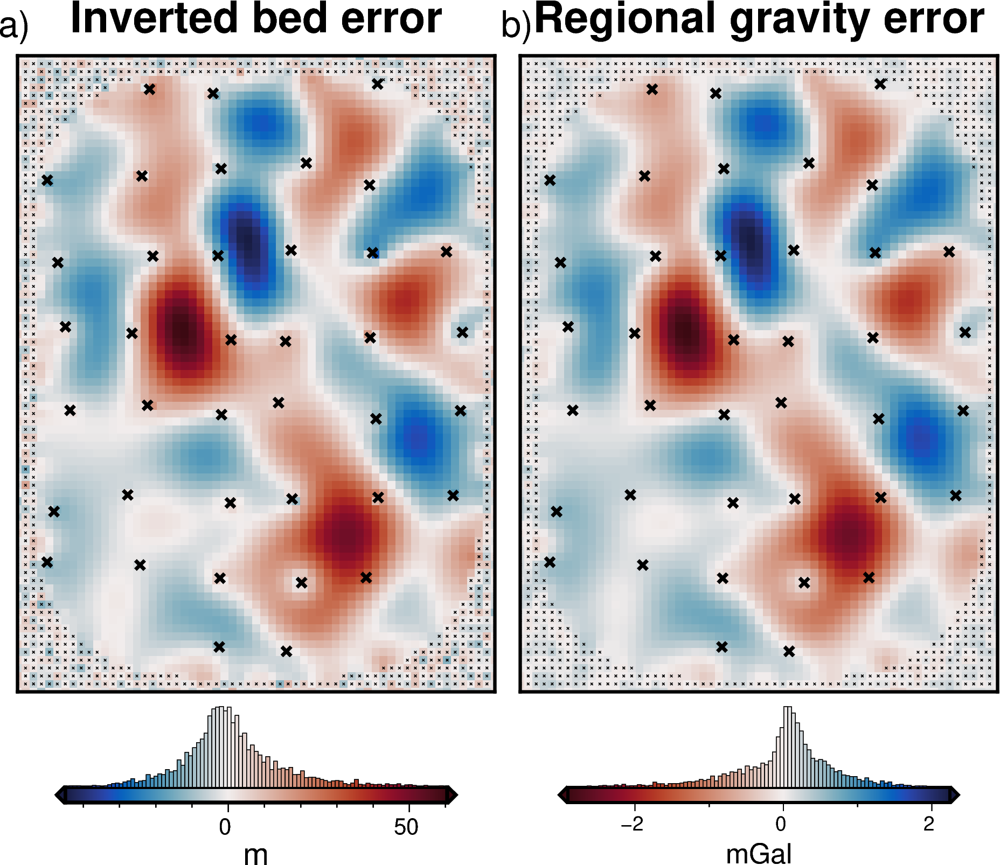

In [27]:
# inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    inv_result[2][inv_result[2].test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = true_regional_grav
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmean(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=10,
    title="Inverted bed error",
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="balance+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"balance+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)
fig.show()

### Repeat with noise

Standard deviation used for noise: [0.5926470115993936]
DC shifted observed gravity by 5.92mGal to match forward gravity.
Highest score: 0.9900037114272419
Best damping: 3.727593720314938e-07
Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.6559250688375854
Best damping: 0.046415888336127774


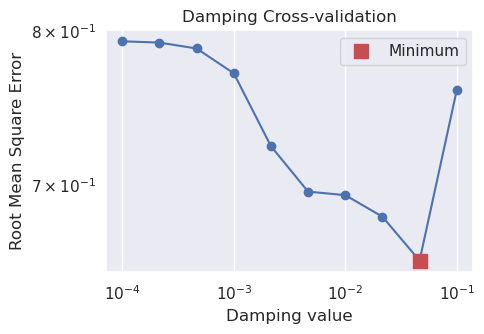

In [31]:
# contaminate with noise
grav_df_noise = grav_df.copy()
grav_df_noise["Gobs"] = synthetic.contaminate(
    grav_df_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)
grav_df_noise = inv.misfit(
    input_grav=grav_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    constraints=constraints,
)

regional_kwargs = dict(
    input_grav=grav_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    regional_method="constraints",
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_anomalies_noise = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../../synthetic_data/Ross_Sea_full_res_noise_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

scores, rmses = inv.inversion_optimal_parameters(
    training_data=df_anomalies_noise[df_anomalies_noise.test == False],
    testing_data=df_anomalies_noise[df_anomalies_noise.test == True],
    parameter_values=dampings,
    function=inv.inversion_damping_MSE,
    plot=False,
    plot_grids=False,
    results_fname=fname,
    progressbar=True,
    true_surface=bed,
    inversion_region=inversion_region,
    **kwargs,
)

# put scores and damping values into dict
CV_results = dict(scores=scores, dampings=dampings, rmses=rmses)

# remove if exists
pathlib.Path(fname).unlink(missing_ok=True)

# save scores and dampings to pickle
with open(f"{fname}.pickle", "wb") as f:
    pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

# delete other results to save space
fnames = []
for i in range(len(dampings)):
    if i == best:
        pass
    else:
        fnames.append(f"{fname}_trial_{i}.pickle")
for f in fnames:
    pathlib.Path(f).unlink(missing_ok=True)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

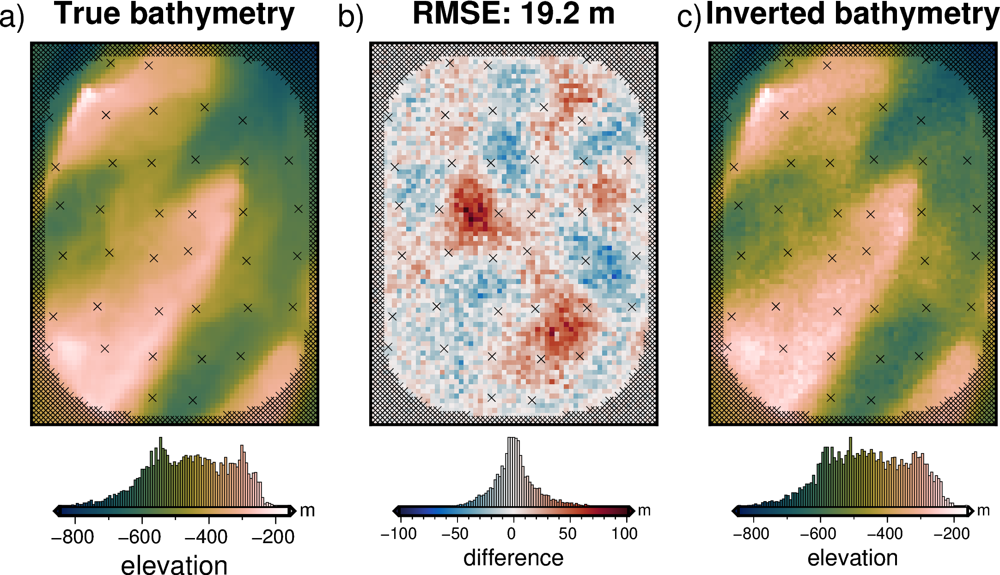

RMSE: 19.237051230642003
constraints RMSE: 0.33


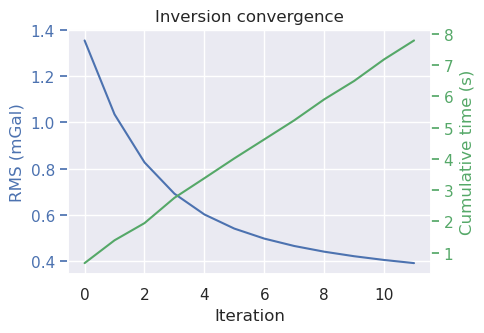

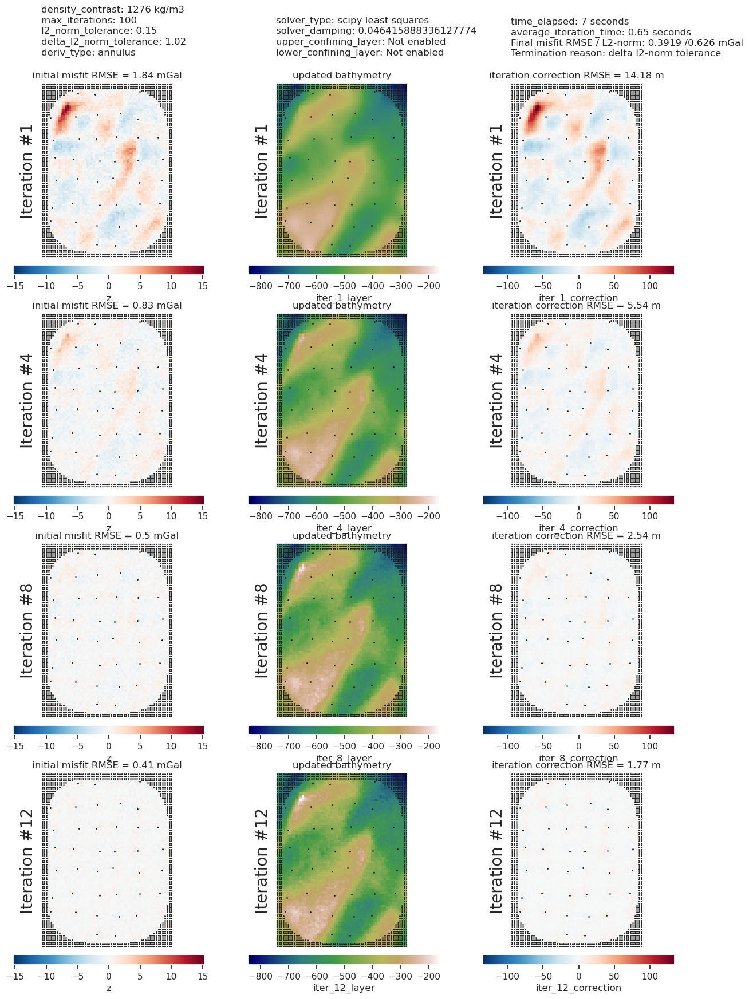

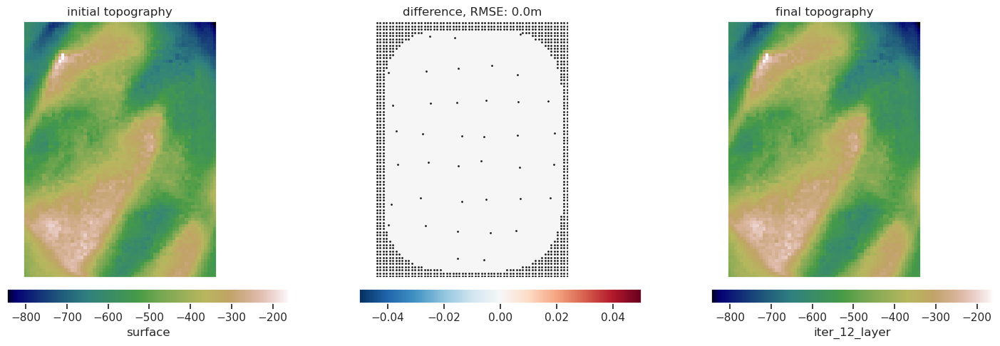

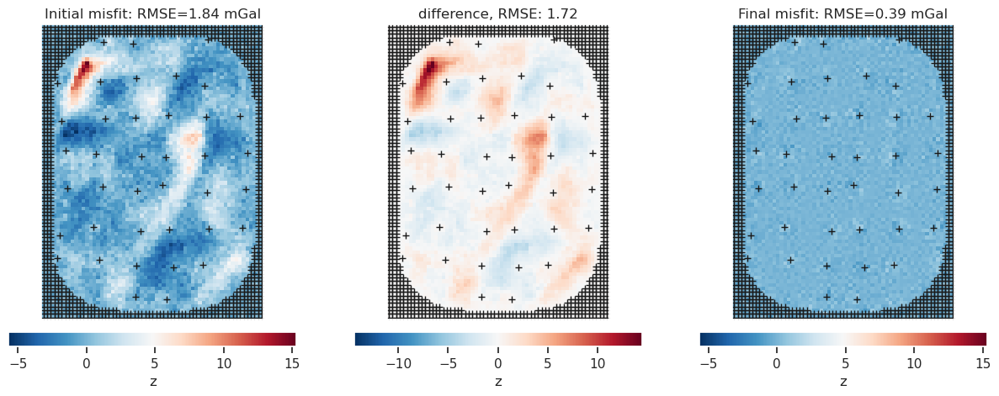

In [30]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies_noise[df_anomalies_noise.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

### Repeat with survey data

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

Best score of 0.0403865831275329 with Hyperparameter=0.01
Best score: 0.0403865831275329
Best damping: 0.01


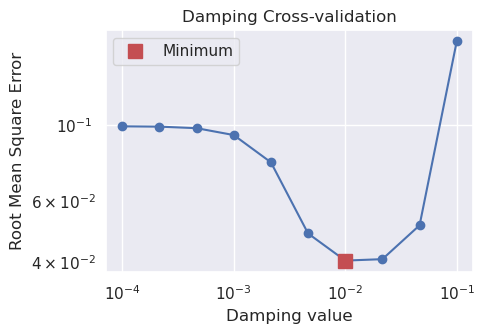

In [32]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../../synthetic_data/Ross_Sea_survey_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

scores, rmses = inv.inversion_optimal_parameters(
    training_data=df_survey_anomalies[df_survey_anomalies.test == False],
    testing_data=df_survey_anomalies[df_survey_anomalies.test == True],
    parameter_values=dampings,
    function=inv.inversion_damping_MSE,
    plot=False,
    plot_grids=False,
    results_fname=fname,
    progressbar=True,
    true_surface=bed,
    inversion_region=inversion_region,
    **kwargs,
)

# put scores and damping values into dict
CV_results = dict(scores=scores, dampings=dampings, rmses=rmses)

# remove if exists
pathlib.Path(fname).unlink(missing_ok=True)

# save scores and dampings to pickle
with open(f"{fname}.pickle", "wb") as f:
    pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)


# delete other results to save space
fnames = []
for i in range(len(dampings)):
    if i == best:
        pass
    else:
        fnames.append(f"{fname}_trial_{i}.pickle")
for f in fnames:
    pathlib.Path(f).unlink(missing_ok=True)


plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

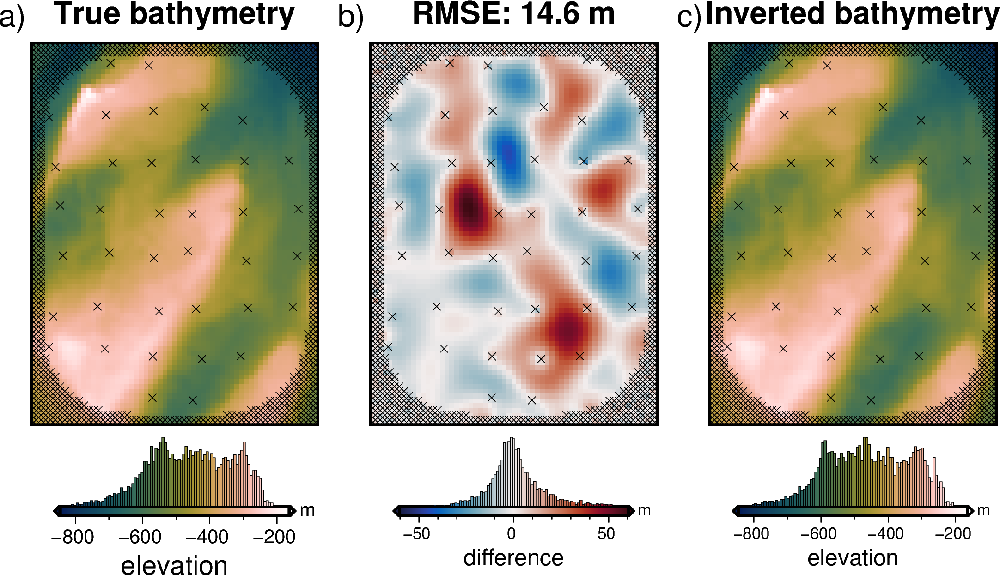

RMSE: 14.64349589201456
constraints RMSE: 0.45


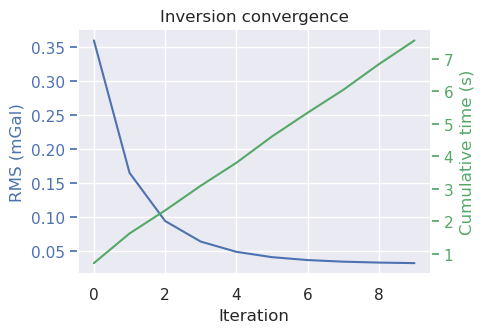

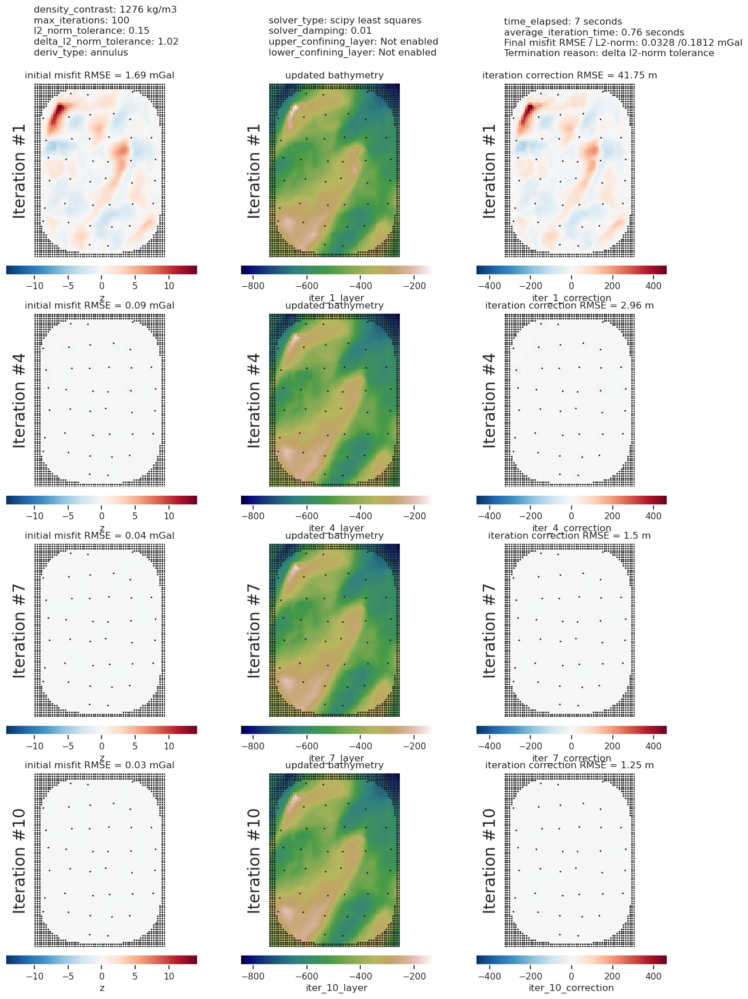

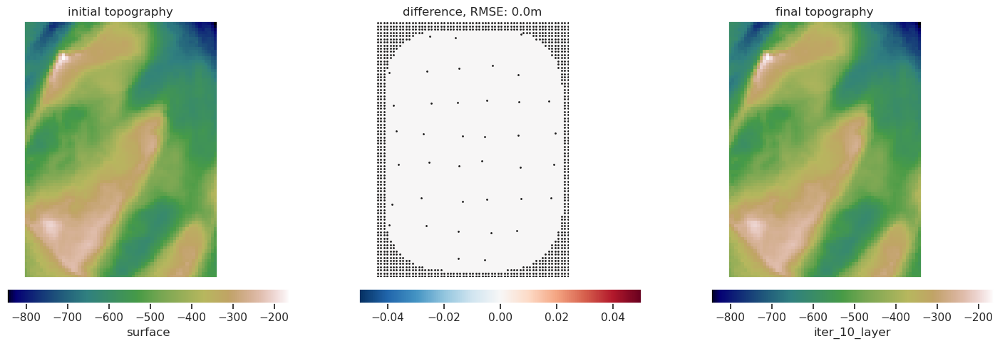

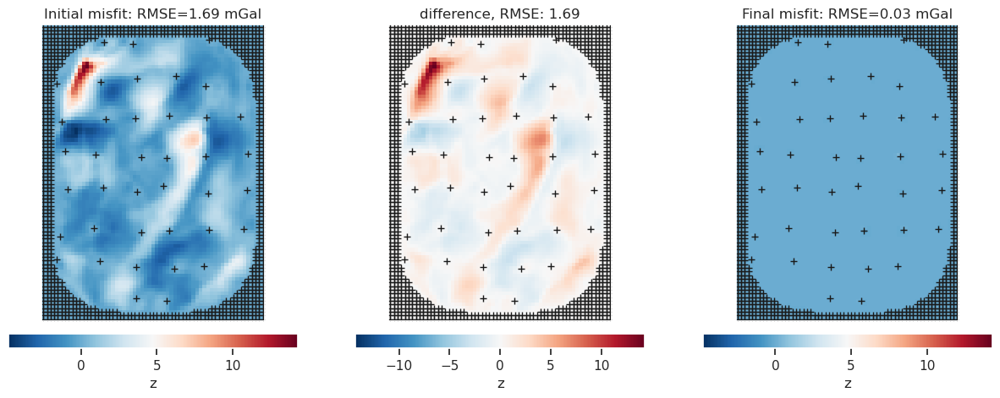

In [34]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_survey_anomalies[df_survey_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

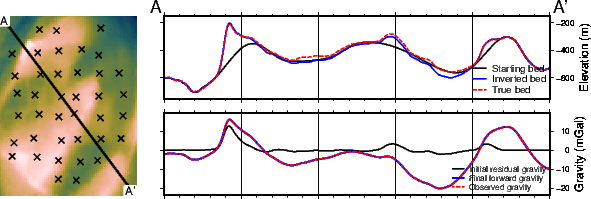

In [35]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="bed_forward",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.02,
    subplot_orientation="horizontal",
    data_legend_loc="jBR+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

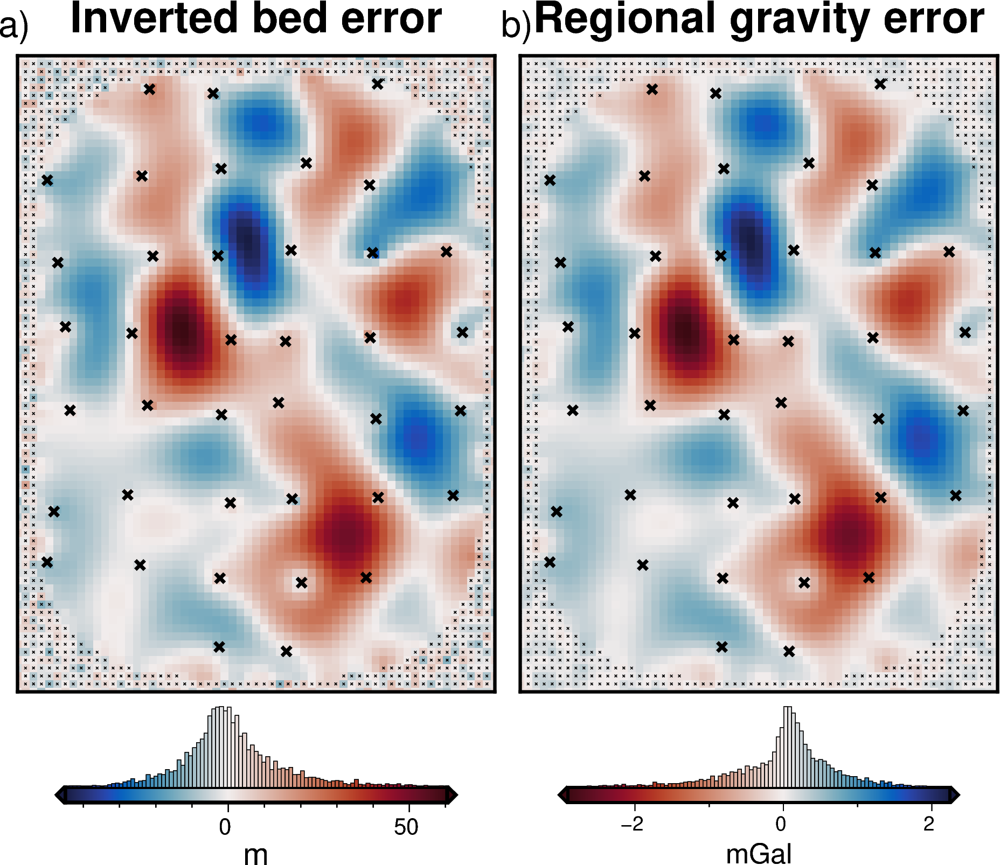

In [36]:
# inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    inv_result[2][inv_result[2].test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = true_regional_grav
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmean(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=10,
    title="Inverted bed error",
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="balance+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"balance+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)
fig.show()

# Repeat with noisey survey data

## Regional separation

Standard deviation used for noise: [0.5924529473560947]
DC shifted observed gravity by 5.75mGal to match forward gravity.
Highest score: 0.9889765343331767
Best damping: 1.3894954943731388e-08


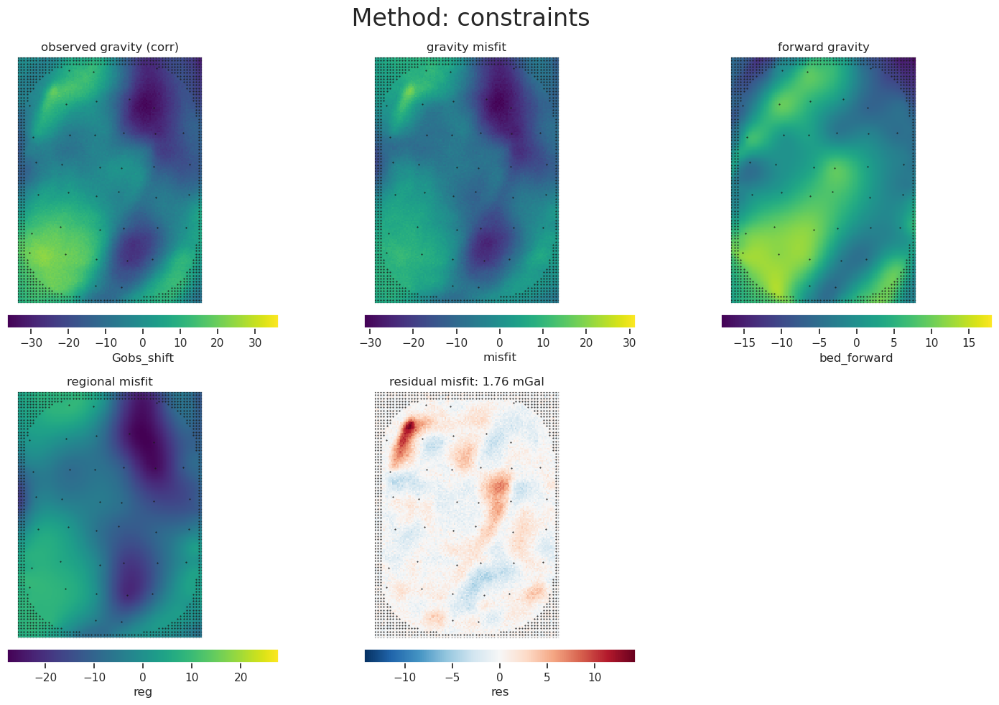

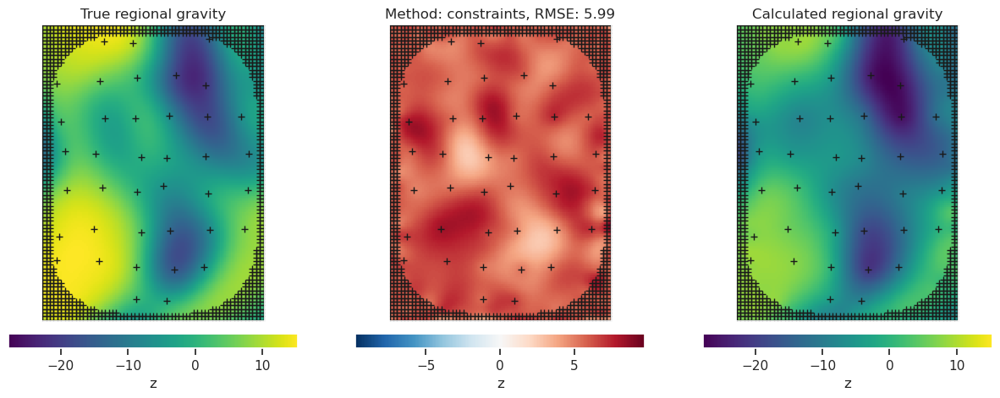

In [37]:
# contaminate with noise
grav_survey_df_noise = grav_survey_df.copy()
grav_survey_df_noise["Gobs"] = synthetic.contaminate(
    grav_survey_df_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)
grav_survey_df_noise = inv.misfit(
    input_grav=grav_survey_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    constraints=constraints,
)

regional_kwargs = dict(
    input_grav=grav_survey_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_survey_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_survey_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

dif = (
    regional_kwargs.get("true_regional")
    - df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg
)
_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=regional_kwargs.get("inversion_region"),
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="viridis",
    # diff_cmap=f"vik+h{np.nanmean(dif)}",
    hist=True,
    inset=False,
    # points_style = "x.2c",
    # points_pen = "1.5p",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

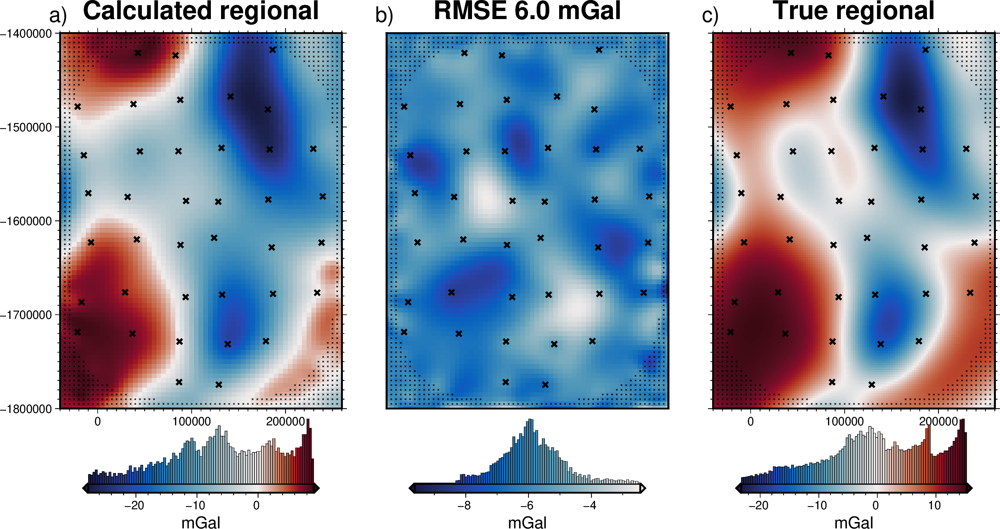

In [38]:
ds = (
    df_survey_anomalies[df_survey_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)


fig = maps.plot_grd(
    ds.reg,
    fig_height=10,
    cmap="balance+h0",
    title="Calculated regional",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

dif = ds.reg - true_regional_grav
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    title=f"RMSE {round(inv_utils.RMSE(dif),1)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    true_regional_grav,
    fig_height=10,
    cmap="balance+h0",
    title="True regional",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig.show()

In [39]:
df_survey_anomalies.to_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies_survey_noise.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [8]:
df_survey_anomalies = pd.read_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies_survey_noise.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_survey_anomalies

,northing,easting,Gobs,test,upward,bed_forward,Gobs_shift,misfit,reg,res
0,-1800000.0,-40000.0,14.287668,False,1000.0,1.588803,8.532919,6.944116,6.648925,0.295191
1,-1800000.0,-37500.0,14.072045,True,1000.0,2.189981,8.317296,6.127315,6.677394,-0.550080
2,-1800000.0,-35000.0,15.014290,False,1000.0,2.731633,9.259541,6.527907,6.685311,-0.157404
3,-1800000.0,-32500.0,16.312788,True,1000.0,3.225948,10.558038,7.332090,6.639794,0.692296
4,-1800000.0,-30000.0,16.553617,False,1000.0,3.687668,10.798868,7.111200,6.557271,0.553928
...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-20.592654,False,1000.0,-16.379783,-26.347404,-9.967621,-9.599613,-0.368008
19477,-1400000.0,252500.0,-20.919847,True,1000.0,-16.835889,-26.674596,-9.838707,-10.226815,0.388108
19478,-1400000.0,255000.0,-22.264334,False,1000.0,-17.321311,-28.019084,-10.697772,-10.656040,-0.041732
19479,-1400000.0,257500.0,-22.746881,True,1000.0,-17.722308,-28.501630,-10.779322,-10.773961,-0.005361


### Plot misfit grids

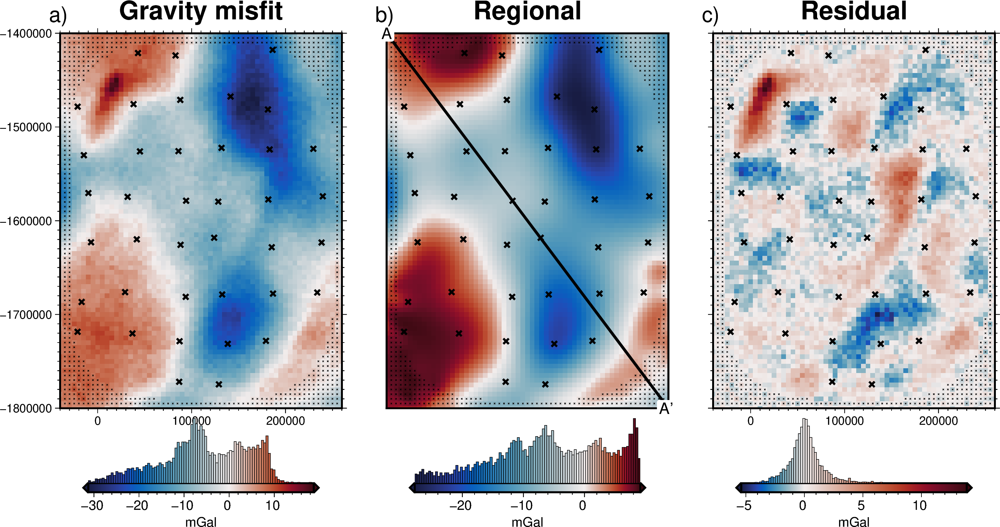

In [163]:
grav_grids = (
    df_survey_anomalies[df_survey_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)

fig = maps.plot_grd(
    grav_grids.misfit,
    fig_height=10,
    cmap="balance+h0",
    title="Gravity misfit",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    grav_grids.reg,
    fig_height=10,
    cmap="balance+h0",
    title=f"Regional",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)
# plot profile location, and endpoints on map
start = [inversion_region[0], inversion_region[3]]
stop = [inversion_region[1], inversion_region[2]]
fig.plot(
    vd.line_coordinates(start, stop, size=100),
    pen="2p,black",
)
fig.text(
    x=start[0],
    y=start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=stop[0],
    y=stop[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)


# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    grav_grids.res,
    fig_height=10,
    cmap="balance+h0",
    title="Residual",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig.show()

### plot profile

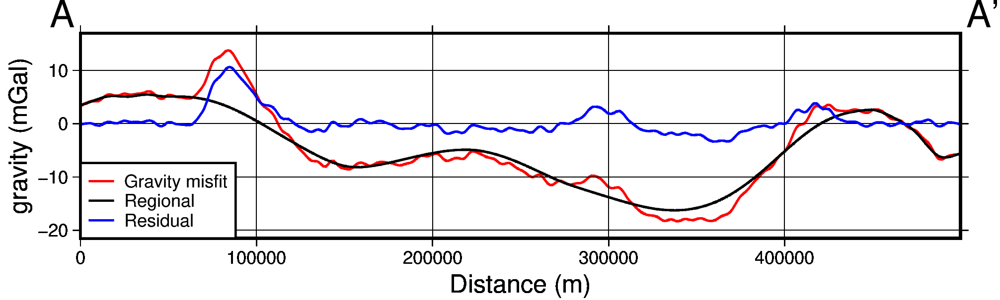

In [159]:
grav_grids = (
    df_survey_anomalies[df_survey_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)

data_grids = [
    grav_grids.misfit,
    grav_grids.reg,
    grav_grids.res,
]

data_names = [
    "Gravity misfit",
    "Regional",
    "Residual",
]

data_dict = profile.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        # "cyan",
        "red",
        "black",
        "blue",
        # "purple",
    ],
    axes=[0, 0, 0],
)
fig, df_data = profile.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jBL+jBL",  # +o0c/.4c",
    data_buffer=0.1,
    data_frame=["neSW", "yag+lgravity (mGal)", "xag+lDistance (m)"],
    data_legend_box="+gwhite+c1p+p1p",
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

In [160]:
# get grid of min dists to nearest constraints
min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
)
df_data = profile.sample_grids(df_data, min_dist, interpolation="b", name="min_dist")

# df_data.describe()

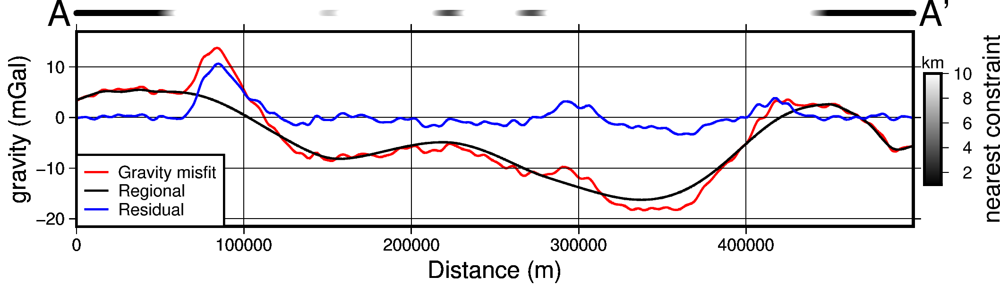

In [162]:
data_max = np.max(df_data[["0", "1", "2"]].values) * 1.5

# series = utils.get_min_max(df_data.min_dist, robust=False)
series = [1e3, 10e3]
pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.colorbar(
    cmap=True,
    position="jMR+w2c/.3c+jML+v+o0.2c/0c",
    frame=[f"xa+lnearest constraint", "y+lkm"],
    scale=0.001,
)

fig.show()

## inversion

Damping values: [0.0001     0.00015849 0.00025119 0.00039811 0.00063096 0.001
 0.00158489 0.00251189 0.00398107 0.00630957 0.01       0.01584893
 0.02511886 0.03981072 0.06309573 0.1       ]
Best score: 0.6662054916092869
Best damping: 0.06309573444801936


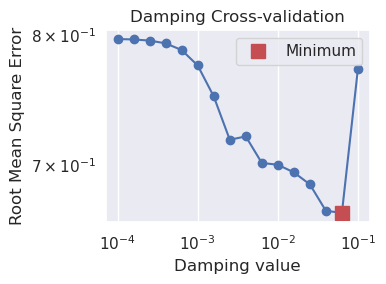

In [220]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../../synthetic_data/Ross_Sea_survey_noise_damping_CV"

dampings = np.logspace(-4, -1, 16)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_survey_anomalies[df_survey_anomalies.test==False],
#     testing_data = df_survey_anomalies[df_survey_anomalies.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=bed,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

# delete other results to save space
fnames = []
for i in range(len(dampings)):
    if i == best:
        pass
    else:
        fnames.append(f"{fname}_trial_{i}.pickle")
for f in fnames:
    pathlib.Path(f).unlink(missing_ok=True)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
    figsize=(4, 3),
)

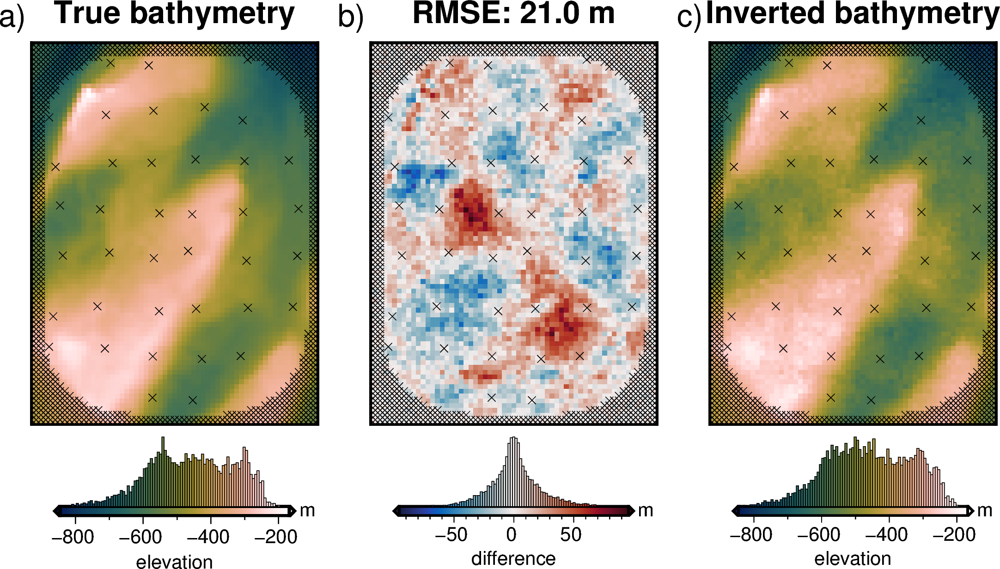

RMSE: 21.039841900213858
constraints RMSE: 0.27


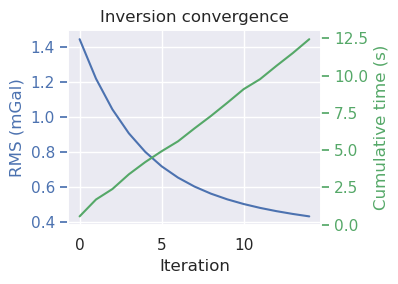

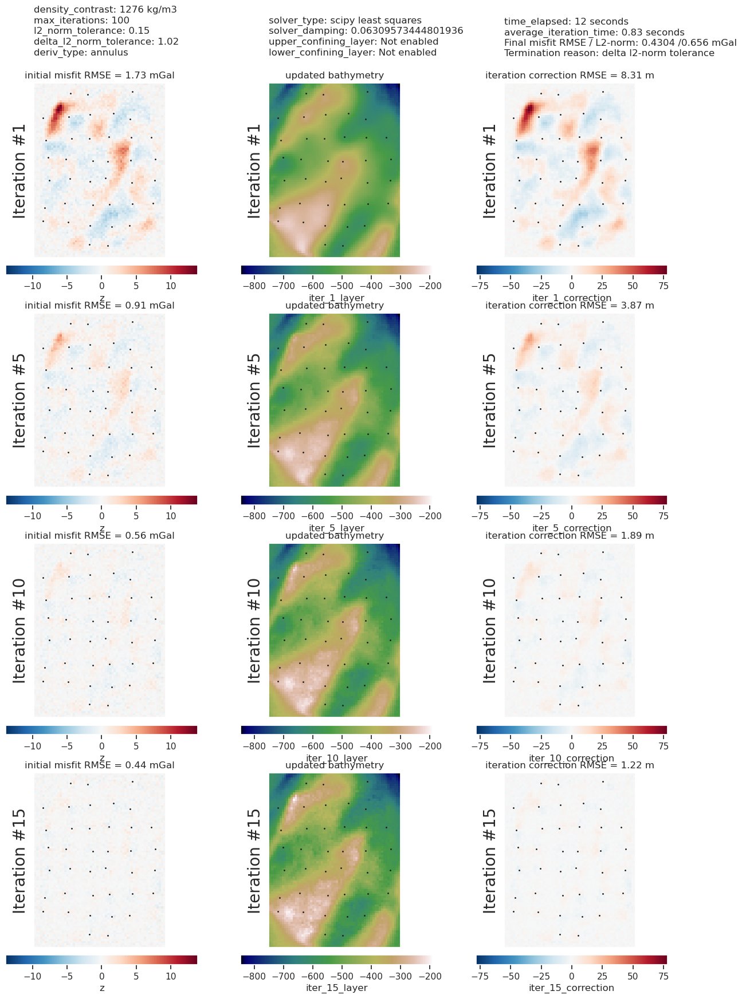

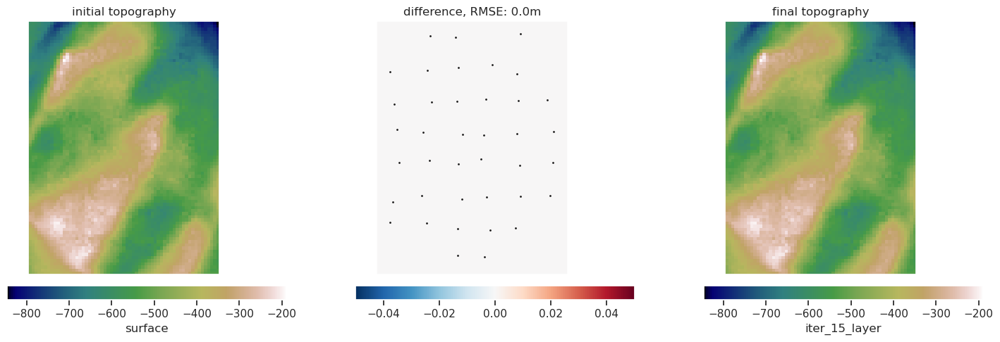

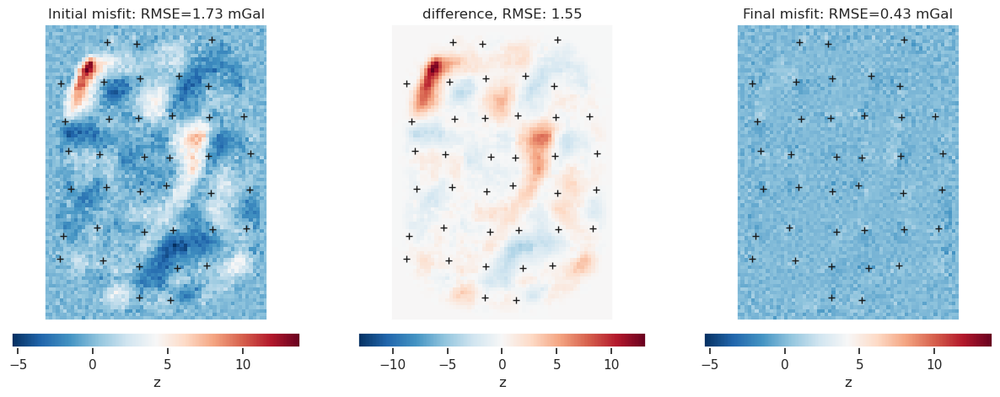

In [221]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_survey_anomalies[df_survey_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(
    inv_result[2],
    iter_times=inv_result[3]["iter_times"],
    figsize=(4, 3),
)

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints[constraints.inside],
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

In [199]:
# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="bed_forward",
#     constraints=constraints[constraints.inside],
#     true_surface=bed,
#     start=[inversion_region[0], inversion_region[3]],
#     stop=[inversion_region[1], inversion_region[2]],
#     # map_buffer=0.05,
#     map=False,
#     subplot_orientation="horizontal",
#     data_legend_loc="jBL+o0c",
#     layers_legend_loc="jBR+o0c",
#     layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
#     data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
# )

### plot profile

In [222]:
prism_ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
grav_ds = inv_result[2].set_index(["northing", "easting"]).to_xarray()

initial_surface = prism_ds.starting_bed

cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_surface = prism_ds[cols[-1]]

cols = [s for s in inv_result[2].columns.to_list() if "_initial_misfit" in s]
initial_residual = grav_ds[cols[0]]

cols = [s for s in inv_result[2].columns.to_list() if "_forward_grav" in s]
final_forward = grav_ds[cols[-1]]

observed = grav_ds.Gobs_shift

topo_names = [
    "Starting bed",
    "Inverted bed",
    "True bed",
]
topo_grids = [
    initial_surface,
    final_surface,
    bed,
]
layers_dict = profile.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=["black", "blue", "red"],
)

data_names = [
    "Initial residual gravity",
    "Final forward gravity",
    "Observed gravity",
]

data_grids = [
    initial_residual,
    final_forward + grav_ds.reg,
    observed,
]

data_dict = profile.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        "black",
        "blue",
        "red",
    ],
)

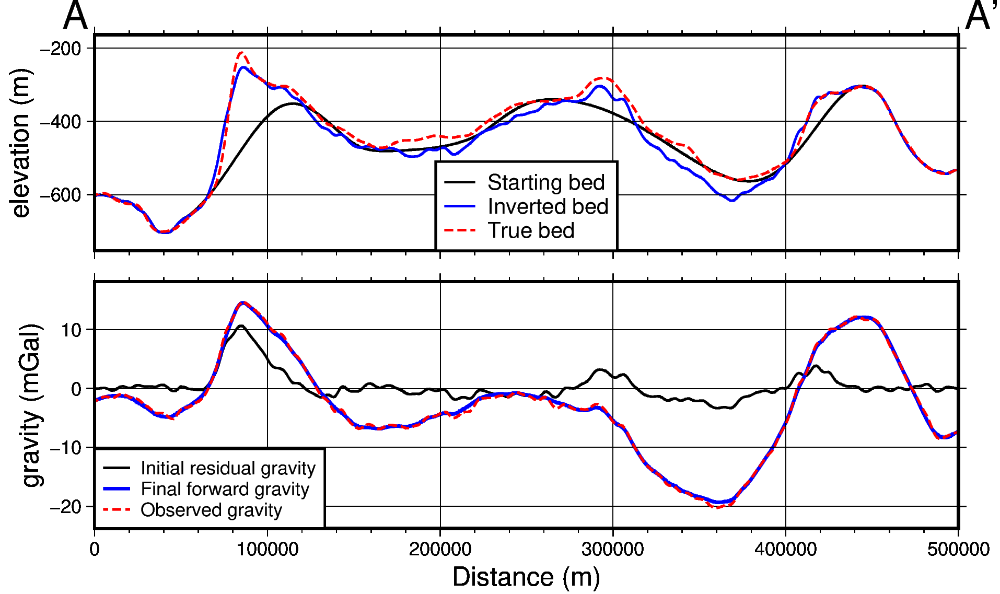

In [225]:
fig, df_layers, df_data = profile.plot_profile(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=8,
    data_height=4,
    fig_width=14,
    data_dict=data_dict,
    data_legend_loc="jBL+jBL",  # +o0c/.4c",
    data_legend_box="+gwhite+c0c+p1p",
    data_buffer=0.1,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lgravity (mGal)"],
    data_pen_style=[None, None, "4_2:2p"],
    data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    layers_dict=layers_dict,
    layers_legend_loc="jBC+jBC",  # +o0c/-.2c",
    layers_legend_box="+gwhite+c0c+p1p",
    fill_layers=False,
    layers_frame=["nesW", "xafg", "yag+lelevation (m)"],
    layer_pen_thickness=[1, 1.5, 1],
    layers_pen_style=[None, None, "4_2:2p"],
    start_label="A",
    end_label="A' ",
)
fig.show()

In [226]:
# get grid of min dists to nearest constraints
min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
)
df_layers = profile.sample_grids(
    df_layers, min_dist, interpolation="b", name="min_dist"
)

# df_data.describe()

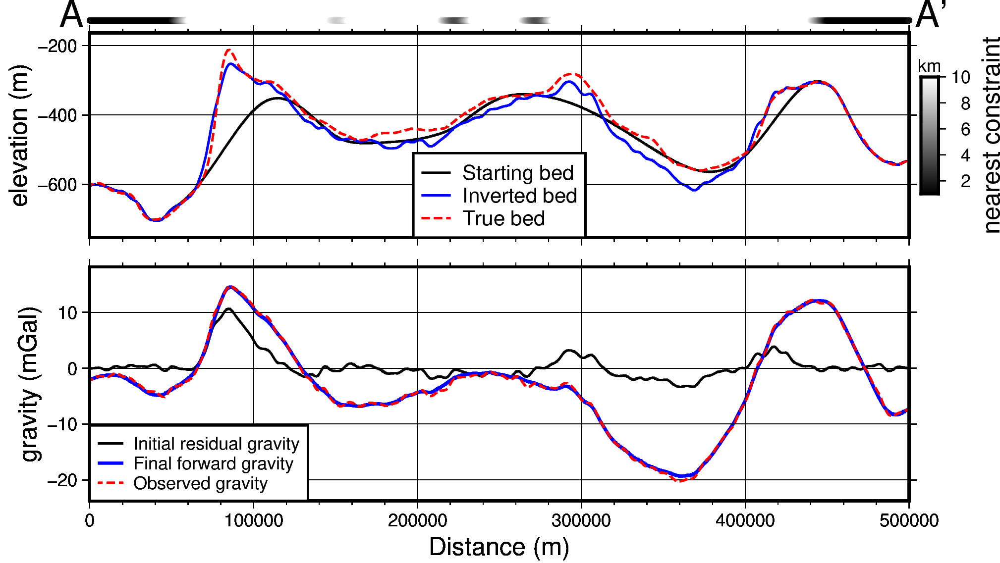

In [227]:
data_max = np.max(df_layers[["0", "1", "2"]].values) * 0.6

# series = utils.get_min_max(df_data.min_dist, robust=False)
series = [1e3, 10e3]
pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.plot(
    x=df_layers.dist,
    y=np.ones_like(df_layers.dist) * data_max,
    style="c0.1c",
    fill=df_layers.min_dist,
    cmap=True,
    no_clip=True,
)
fig.colorbar(
    cmap=True,
    position="jMR+w2c/.3c+jML+v+o0.2c/0c",
    frame=[f"xa+lnearest constraint", "y+lkm"],
    scale=0.001,
)

fig.show()

In [193]:
dif = bed - final_surface
dif_masked = utils.mask_from_shp(
    "../../data/Ross_Sea_outline.shp",
    xr_grid=dif,
    masked=True,
    invert=False,
)

mapproject [WARNING]: For a UTM or TM projection, your region -40000.0/260000.0/-1800000.0/-1400000.0 is too large to be in degrees and thus assumed to be in meters


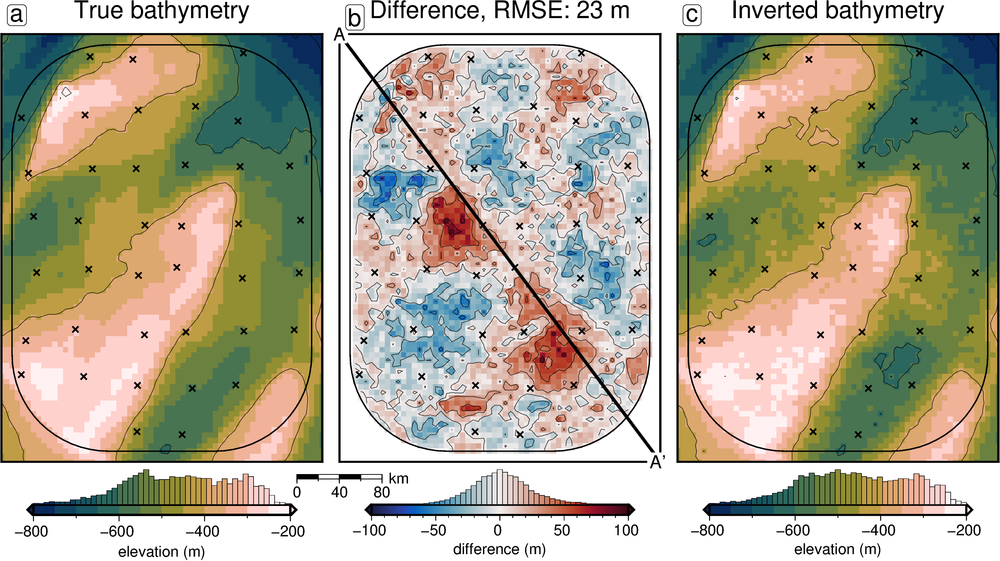

In [205]:
titles = [
    "True bathymetry",
    f"Difference, RMSE: {int(utils.RMSE(dif_masked))} m",
    "Inverted bathymetry",
]
cbar_labels = [
    "elevation (m)",
    "difference (m)",
    "elevation (m)",
]
grids = [
    bed,
    dif_masked,
    final_surface,
]

lims = [-800, -200]
pygmt.grd2cpt(
    grid=final_surface,
    cmap="batlowW",
    limit=lims,
    nlevels=13,
    output="../../plotting/tmp.cpt",
)

region = inversion_region

for i, g in enumerate(grids):
    if i == 0:
        fig = None
        origin_shift = "initialize"
        xshift_amount = 1
    else:
        fig = fig
        origin_shift = "xshift"
        xshift_amount = 1

    if i == 1:
        cmap = "balance+h0"
        # lims = utils.get_min_max(
        #     g,
        #     robust=True,
        # )
        # lims = (-vd.maxabs(lims), vd.maxabs(lims))
        lims = [-100, 100]
    else:
        cmap = "../../plotting/tmp.cpt"
        lims = [-800, -200]

    fig = maps.plot_grd(
        grid=g,
        fig_height=10,
        title=titles[i],
        title_font="16p,Helvetica,black",
        region=region,
        cmap=cmap,
        cpt_lims=lims,
        cbar_label=cbar_labels[i],
        # frame=frame,
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
    )
    if i == 1:
        fig.grdcontour(
            grid=g,
            interval=25,
            annotation=None,
            transparency=20,
            # resample=10e3,
            # cut="1C",
        )
        # plot profile location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
    else:
        fig.grdcontour(
            grid=g,
            interval=200,
            annotation=None,
            # pen=".2p,white",
            transparency=20,
            # resample=10e3,
            # cut="1C",
        )

    fig.plot(
        x=constraints[constraints.inside].easting,
        y=constraints[constraints.inside].northing,
        style="x.2c",
        pen="1p,black",
    )
    fig.plot(
        "../../data/Ross_Sea_outline.shp",
        pen="0.8p,black",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.2/-.6",
        clearance="+tO",
        no_clip=True,
    )

    if i == 1:
        info = utils.set_proj(
            region,
            fig_height=10,
        )
        maps.add_scalebar(fig, region, info[1], position="n0/-.04")
        # maps.add_north_arrow(fig, region, info[1], position="n.45/.07")
fig.show()

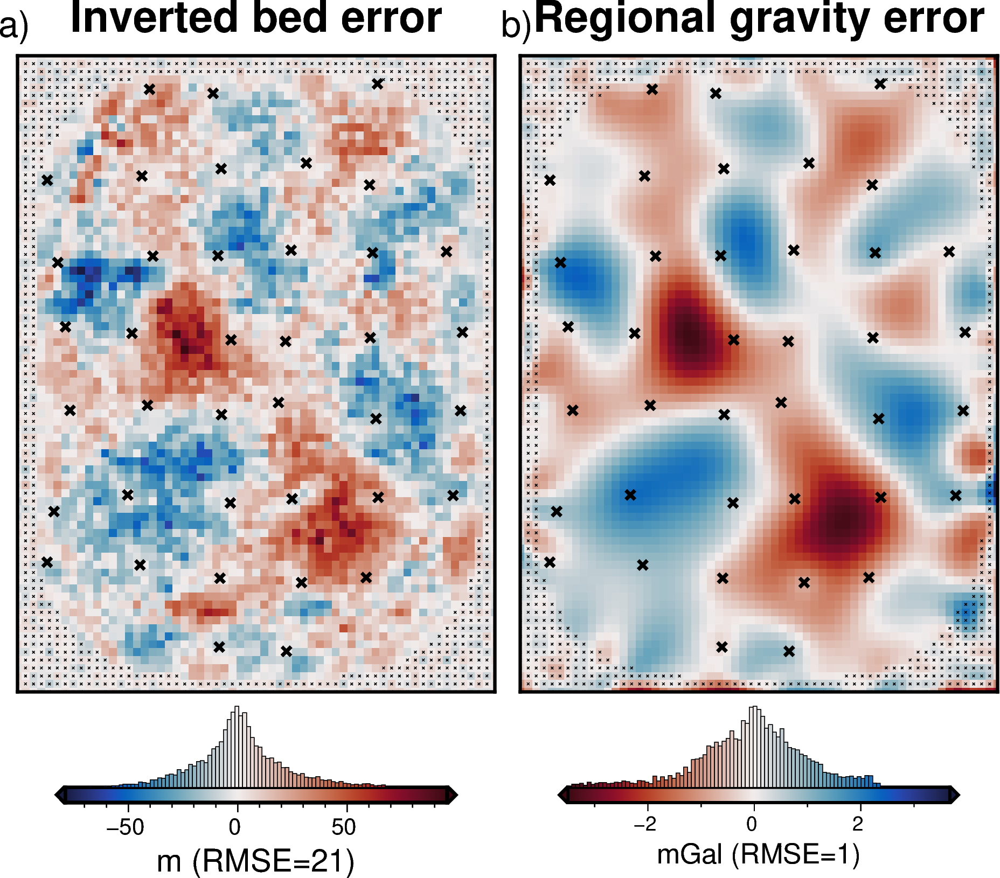

In [47]:
# inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    inv_result[2][inv_result[2].test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = true_regional_grav
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmedian(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=10,
    title="Inverted bed error",
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="balance+h0",
    cbar_label=f"m (RMSE={int(inv_utils.RMSE(bed_dif))})",
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"balance+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label=f"mGal (RMSE={int(inv_utils.RMSE(reg_dif))})",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)


min_max = utils.get_min_max(bed_dif, robust=True)
norm_reg_dif = -1 * inv_utils.normalize_xarray(reg_dif, low=min_max[0], high=min_max[1])
bed_dif_after_regional_error = bed_dif - norm_reg_dif

# fig = maps.plot_grd(
#     bed_dif_after_regional_error,
#     title="Remaining bed error",
#     cmap=f"balance+h0",
#     fig=fig,
#     hist=True,
#     points=constraints[constraints.inside].rename(
#         columns={"easting": "x", "northing": "y"}
#     ),
#     points_style="x.2c",
#     points_pen="1.5p",
#     origin_shift="xshift",
#     cbar_label=f"m (RMSE={int(inv_utils.RMSE(bed_dif_after_regional_error))})",
#     cbar_yoffset=1.5,
# )

# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x=constraints[constraints.inside == False].easting,
#     y=constraints[constraints.inside == False].northing,
#     style="x.05c",
# )

fig.show()

In [48]:
# save final bed
output = final_bed.to_dataset(name="z")
output.to_zarr(
    "../../synthetic_data/Ross_Sea_inverted_bed_survey_noise.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)